Tilte: Seattle AirBnB_1

Author: Kazutoki Matsui

## 1. Business Understanding

In this project, I would like to look into how the rental prices are determined for Airbnb listings in Seattle. My potential audience could be someone who are currently running a vacation rental business or those who are thinking of starting it.

To understand the factors of determining rent price on Airbnb listings, I use “Kaggle Seattle Airbnb Open Data”(https://www.kaggle.com/airbnb/seattle), which contains listings data in Seattle. This dataset includes time series data from January to December 2016, as well as cross-sectional data. I will look into this by exploring the following three sub-questions:

1. When are the rent prices over the year?
2. What are the prices in the neighborhoods?
3. Which variables have a strong relationship with the price of listings?

In [11]:
## Import necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import folium
import folium.plugins
import branca
import branca.colormap as cm
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn import ensemble

%matplotlib inline

# Calendar Dataset

## Data Understanding

First, I read in the calendar dataset and explore it.
It seems the data types are not as expected since the price is categorized as object, not int or float. I need to change the data type.

In [12]:
## Calendar Dataset
calendar = pd.read_csv('./data/calendar.csv')
calendar.head()

,listing_id,date,available,price
0,241032,2016-01-04,t,$85.00
1,241032,2016-01-05,t,$85.00
2,241032,2016-01-06,f,NaN
3,241032,2016-01-07,f,NaN
4,241032,2016-01-08,f,NaN


In [13]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1393570 entries, 0 to 1393569
Data columns (total 4 columns):
 #   Column      Non-Null Count    Dtype 
---  ------      --------------    ----- 
 0   listing_id  1393570 non-null  int64 
 1   date        1393570 non-null  object
 2   available   1393570 non-null  object
 3   price       934542 non-null   object
dtypes: int64(1), object(3)
memory usage: 42.5+ MB


## Data Preparation

In [14]:
## Process the data cleaning and feature engineering for calendar dataset
calendar = pd.read_csv('./data/calendar.csv')
# calendar = calendar[calendar['price'].notna()]
'''Convert string price into numerics'''
calendar['price'] = calendar['price'].fillna('$0')
calendar['price'] = calendar['price'].apply(lambda x: x.replace("$", ""))
calendar['price'] = calendar['price'].apply(lambda x: x.replace(",", ""))
calendar['price'] = pd.to_numeric(calendar['price'])

'''Create a column called occupied'''
occupied = []
for row in calendar['available']:
    if row == 't':
        occupied.append(0)
    elif row == 'f':
        occupied.append(1)
calendar['occupied'] = occupied

'''Convert availability into boolean values'''
avail = []
for row in calendar['available']:
    if row == 't':
        avail.append(True)
    elif row == 'f':
        avail.append(False)
calendar['available'] = avail

'''Convert object to datetime.date object'''
calendar['date'] = calendar['date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d').date())

'''Create a weekday column corresponding the weekday of the date'''
weekday = {'Mon': 0, 'Tue':1, 'Wed': 2, 'Thu': 3, 'Fri': 4, 'Sat':5, 'Sun': 6}
calendar['weekday'] = calendar['date'].apply(lambda x: x.weekday())
calendar['weekday'] = calendar['weekday'].apply(lambda x: list(weekday.keys())[list(weekday.values()).index(x)])

'''Create a month column corresponding to the month of the date'''
calendar['month'] = calendar['date'].apply(lambda x: x.month)

calendar.head()

,listing_id,date,available,price,occupied,weekday,month
0,241032,2016-01-04,True,85.0,0,Mon,1
1,241032,2016-01-05,True,85.0,0,Tue,1
2,241032,2016-01-06,False,0.0,1,Wed,1
3,241032,2016-01-07,False,0.0,1,Thu,1
4,241032,2016-01-08,False,0.0,1,Fri,1


## Analysis/Modelling

Here I will analyze the price trands by date and month to answer the first question, 1. When are the rent prices over the year?.

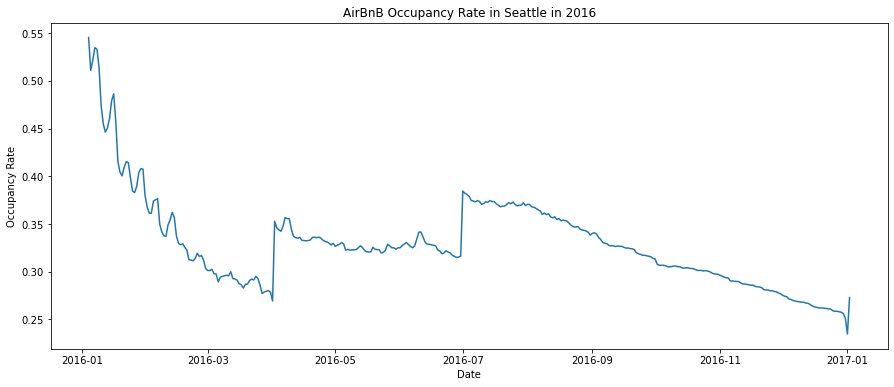

In [15]:
## Check the occupancy rate
plt.figure(figsize=(15,6))
plt.plot(calendar.groupby('date').mean()['occupied'])
plt.title('AirBnB Occupancy Rate in Seattle in 2016')
plt.xlabel('Date')
plt.ylabel('Occupancy Rate')
plt.savefig('OccupancyRate.png')

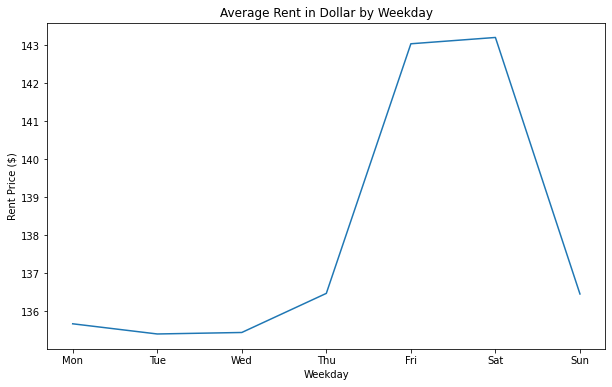

In [16]:
weekday = {'Mon': 0, 'Tue':1, 'Wed': 2, 'Thu': 3, 'Fri': 4, 'Sat':5, 'Sun': 6}
week_list = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

calendar['weekday'] = calendar['date'].apply(lambda x: x.weekday())
calendar['weekday'] = calendar['weekday'].apply(lambda x: list(weekday.keys())[list(weekday.values()).index(x)])
available = calendar[calendar['available']==True]


by_weekly = available.groupby(by=['weekday']).mean()['price'].sort_values()
by_weekly = by_weekly.to_dict()
by_weekly = {k: by_weekly[k] for k in week_list if k in by_weekly}
by_weekly = pd.DataFrame({'day': list(by_weekly.keys()),  'average': list(by_weekly.values())})

plt.figure(figsize=(10,6))
plt.plot(by_weekly['day'], by_weekly['average'])
plt.title('Average Rent in Dollar by Weekday')
plt.ylabel('Rent Price ($)')
plt.xlabel('Weekday')
plt.savefig('weekday_price_move.png')

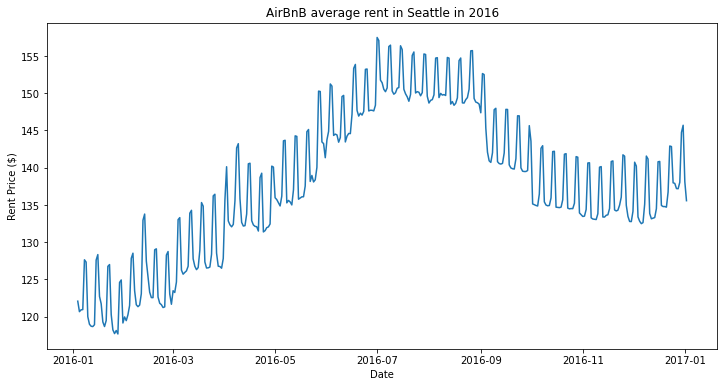

In [17]:
## Check the average price for available listings
available = calendar[calendar['available']==True]
plt.figure(figsize=(12,6))
plt.plot(available.groupby('date').mean()['price'])
plt.title('AirBnB average rent in Seattle in 2016')
plt.xlabel('Date')
plt.ylabel('Rent Price ($)')
plt.savefig('daily_price_move.png')

## Evaluation

The results so far make sense. We can easily imagine that the listings have higher prices on weekends, and as people go vacation in summer. I just wanted to look deeper by months. The average price by month below is somewhat confusing. The price starts from low in January and goes up by 30% in December that year. I may need to look at it more.
Furthermore, I plot the occupancy rate based on the availability variable. This plot is also confusing intuitively. The occupancy rate starts from relatively high around 40% in January and ends around 27.5% in December. This may be due to some event that was specific to the year. 

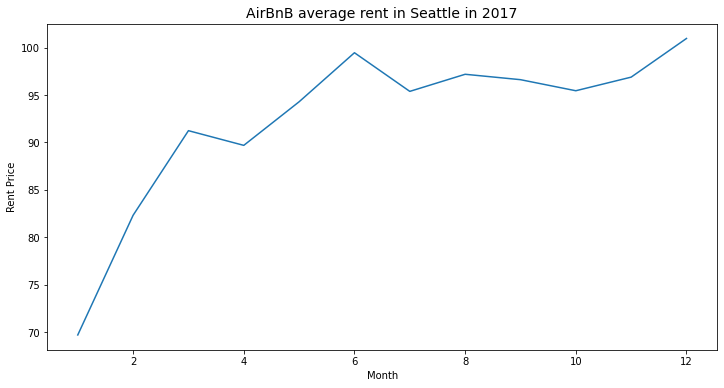

In [18]:
plt.figure(figsize=(12,6))
plt.plot(calendar.groupby('month').mean()['price'])
plt.title('AirBnB average rent in Seattle in 2017', fontsize=14)
plt.xlabel('Month')
plt.ylabel('Rent Price')

plt.show()

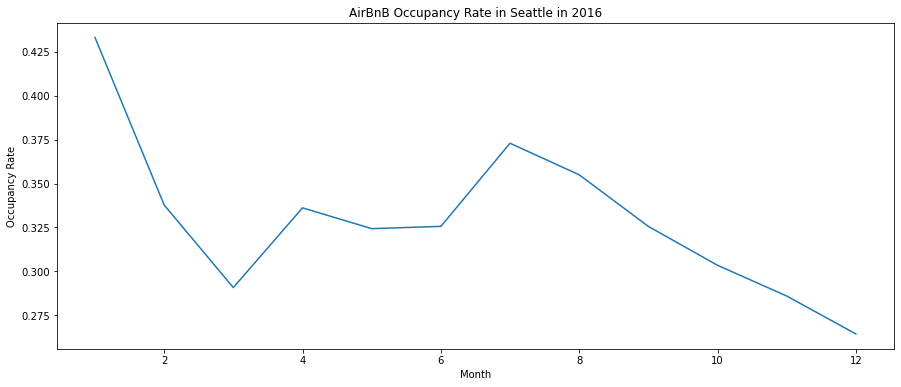

In [19]:
## Check the occupancy rate
plt.figure(figsize=(15,6))
plt.plot(calendar.groupby('month').mean()['occupied'])
plt.title('AirBnB Occupancy Rate in Seattle in 2016')
plt.xlabel('Month')
plt.ylabel('Occupancy Rate')
plt.savefig('OccupancyRate.png')

# Listings Dataset

## Data Understanding

Now I load the listings data to understand cross-sectional prices. The dataset seems to have a lot of columns that may or may not be helpful analyzing the price structure. So to narrow down the scope, I will explore what are inside the variables. 

In [20]:
listings = pd.read_csv('./data/listings.csv')
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,f,NaN,WASHINGTON,f,flexible,f,f,1,NaN
4,278830,https://www.airbnb.com/rooms/278830,20160104002432,2016-01-04,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,9.0,f,NaN,WASHINGTON,f,strict,f,f,1,0.89


In [21]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 92 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                3818 non-null   int64  
 1   listing_url                       3818 non-null   object 
 2   scrape_id                         3818 non-null   int64  
 3   last_scraped                      3818 non-null   object 
 4   name                              3818 non-null   object 
 5   summary                           3641 non-null   object 
 6   space                             3249 non-null   object 
 7   description                       3818 non-null   object 
 8   experiences_offered               3818 non-null   object 
 9   neighborhood_overview             2786 non-null   object 
 10  notes                             2212 non-null   object 
 11  transit                           2884 non-null   object 
 12  thumbn

In [22]:
listings.isnull().sum()

id                                    0
listing_url                           0
scrape_id                             0
last_scraped                          0
name                                  0
                                   ... 
cancellation_policy                   0
require_guest_profile_picture         0
require_guest_phone_verification      0
calculated_host_listings_count        0
reviews_per_month                   627
Length: 92, dtype: int64

## Data Preparation

Data understanding taught me that some variables have inproper data types and also missing values. First I need to preprocess them.
I will focus on price, beds, bedrooms, bathrroms, reviews_per_month, and host_is_superhost, as they seem to correlate with the price.

In [23]:
listings = pd.read_csv('./data/listings.csv')
listings['price'] = listings['price'].apply(lambda x: x.replace("$", ""))
listings['price'] = listings['price'].apply(lambda x: x.replace(",", ""))
listings['price'] = pd.to_numeric(listings['price'])

'''Drop extreme outliers in price'''
from scipy import stats
listings = listings[(np.abs(stats.zscore(listings[['price']])) < 3).all(axis=1)]

'''Fill in missing values with the most frequent values'''
listings['beds'] = listings['beds'].fillna(listings['beds'].mode().iloc[0])
listings['bedrooms'] = listings['bedrooms'].fillna(listings['bedrooms'].mode().iloc[0])
listings['bathrooms'] = listings['bathrooms'].fillna(listings['bathrooms'].mode().iloc[0])
listings['bathrooms'] = listings['bathrooms'].fillna(listings['bathrooms'].mode().iloc[0])
listings['reviews_per_month'] = listings['reviews_per_month'].fillna(listings['reviews_per_month'].mode().iloc[0])

listings['price_per_beds'] = listings['price'] / listings['beds']

## Fill in the missing values with false
is_superhost = []
for row in listings['host_is_superhost']:
    if row == 't':
        is_superhost.append(1)
    else:
        is_superhost.append(0)
listings['host_is_superhost'] = is_superhost

'''Fill in missing zipcode manually'''
missed_zipcode = [98107, 98119, 98122, 98104, 98199, 98102, 98122]
listings.loc[listings.zipcode.isnull(), 'zipcode'] = missed_zipcode
listings['zipcode'] = listings['zipcode'].astype(str)

listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,price_per_beds
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07,85.0
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,f,NaN,WASHINGTON,f,strict,t,t,6,1.48,150.0
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,f,NaN,WASHINGTON,f,flexible,f,f,1,1.00,50.0
5,5956968,https://www.airbnb.com/rooms/5956968,20160104002432,2016-01-04,Private unit in a 1920s mansion,We're renting out a small private unit of one ...,If you include a bit of your background in you...,We're renting out a small private unit of one ...,none,This part of Queen Anne has wonderful views an...,...,f,NaN,WASHINGTON,f,strict,f,f,1,2.45,120.0
6,1909058,https://www.airbnb.com/rooms/1909058,20160104002432,2016-01-04,Queen Anne Private Bed and Bath,Enjoy a quiet stay in our comfortable 1915 Cra...,Enjoy a quiet stay in our comfortable 1915 Cra...,Enjoy a quiet stay in our comfortable 1915 Cra...,none,"Close restaurants, coffee shops and grocery st...",...,f,NaN,WASHINGTON,f,moderate,f,f,1,2.46,80.0


## Modelling

From now on, I start to conduct some analysis on the processed dataset. I will mainly address the latter two questions(, 2. What are the prices in the neighborhoods? AND 3. Which variables have a strong relationship with the price of listings?).   

### 1. Overview distribution of the listings
I plot the listings with dots in the Seattle map below, and color the each dot by its rent price per night. At a first glance, I see that the listings are concentrated around the so-called Downtown area in the middle of the city.

In [24]:
## Creating a map, credit: https://towardsdatascience.com/creating-a-simple-map-with-folium-and-python-4c083abfff94
# from folium.plugins import HeatMap
sub_map = listings[["latitude", "longitude", "id","price", "price_per_beds","bedrooms","property_type","accommodates"]]

map = folium.Map(location=[sub_map.latitude.mean(),
                           sub_map.longitude.mean()],
                 zoom_start=11, control_scale=True)

colormap = cm.LinearColormap(colors=['blue', 'cyan', 'yellow', 'orange', 'red'],
                             index=[0, 100, 200, 300, 400], vmin=0, vmax=400,
                             caption='Rent Price')

lat = list(sub_map.latitude)
lon = list(sub_map.longitude)
price = list(sub_map.price)
price_per_bed = list(sub_map.price_per_beds)


for loc, p in zip(zip(lat, lon), price):
    rent = sub_map[(sub_map['latitude'] == loc[0]) & (sub_map['longitude'] == loc[1])]['price'].item()
    prop = sub_map[(sub_map['latitude'] == loc[0]) & (sub_map['longitude'] == loc[1])]['property_type'].item()
    person = sub_map[(sub_map['latitude'] == loc[0]) & (sub_map['longitude'] == loc[1])]['accommodates'].item()
    bedroom = int(sub_map[(sub_map['latitude'] == loc[0]) & (sub_map['longitude'] == loc[1])]['bedrooms'].item())
    popup = f'lat:{loc[0]},\nlon:{loc[1]},\n{prop},\n{bedroom} bedrooms,\n${rent}.'
    
    folium.CircleMarker(
        location=loc,
        radius=1.5,
        fill = True,
        color=colormap(p),
        opacity=0.5,
        popup = popup
    ).add_to(map)

map.add_child(colormap)


# for index, location_info in sub_map.iterrows():
#     folium.CircleMarker([location_info["latitude"], location_info["longitude"]],
#                         popup=location_info["id"], radius=1, opacity=0.5).add_to(map)

# HeatMap(sub_map).add_to(map)
map.save('C:/Users/81801/OneDrive/ドキュメント/★Programming/★★Udacity/Seattle-AirBnB/ScatterListings.html')
map

### 2-1. Check the price trends by neighborhoods - create a choropleth map
I checked the median price over night in the neighborhood in the map below. (Here I used the median price, not average, because some large listings with high price might affect the overall analysis.)

In [26]:
neighbor = listings.groupby('neighbourhood_cleansed').mean()
meds = listings.groupby('neighbourhood_cleansed').median()['price']
neighbor['med_price'] = meds
counts = pd.DataFrame({'num_of_listings' :listings['neighbourhood_cleansed'].value_counts()})
neighbor = neighbor.join(counts)
neighbor = neighbor.reset_index()
map = folium.Map(location=[neighbor.latitude.mean(),
                           neighbor.longitude.mean()],
                 zoom_start=11, control_scale=True)

In [27]:
## Credit: https://medium.com/@sosterburg/mapping-data-with-folium-356f0d6f88a9
import json
with open('./data/City_Clerk_Neighborhoods.geojson', 'r') as jsonFile:
    geo_data = json.load(jsonFile)
tmp = geo_data

geozips = []
for i in np.arange(len(tmp['features'])):
    if tmp['features'][i]['properties']['S_HOOD'] in list(neighbor['neighbourhood_cleansed'].unique()):
        geozips.append(tmp['features'][i])
        
# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips
# save uodated JSON object
open("cleaned_geodata.json", "w").write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': '))) 

6150864

In [28]:
def map_feature_by_neighbor(neighbor, col):
    """
    Generates a folium map of Seattle
    :param neighbor: neighborhood dataset
    :param col: feature to display
    :return: m
    """
    # read updated geo data
    with open('cleaned_geodata.json', 'r') as jsonFile:
        king_geo = json.load(jsonFile)

    # Initialize Folium Map with Seattle latitude and longitude
    m = folium.Map(location=[neighbor.latitude.mean(), neighbor.longitude.mean()], zoom_start=10,
                   detect_retina=True, control_scale=False)
    
    # prepare the customised text
    popup_text = []
    for i in range(len(neighbor)):
        name = neighbor['neighbourhood_cleansed'][i]
        rent = round(neighbor['med_price'][i], 1)
        num = neighbor['num_of_listings'][i]
        popup = f'<b>{name}</b>, \n{num} listings, \n Median Rent: ${rent}'
        popup_text.append(popup)
    neighbor['popup_text'] = popup_text

    # Append a tooltip column with customised text
    for idx in range(len(popup_text)):
        hood = king_geo['features'][idx]['properties']['S_HOOD']
        king_geo['features'][idx]['properties']['District'] = neighbor[neighbor['neighbourhood_cleansed']==hood]['popup_text'].item()
    
    
    # Create choropleth map
    m.choropleth(
        geo_data=king_geo,
        name='choropleth',
        data= neighbor,
        # col: feature of interest
        columns=['neighbourhood_cleansed', col],
        key_on = 'feature.properties.S_HOOD',
        fill_color= 'Spectral_r',
        fill_opacity=0.8,
        line_opacity=0.2,
        legend_name='Median Rent Price'
    )
    
    folium.GeoJson(king_geo,
                   style_function= lambda feature: {
#                        'fillColor': colormap(feature),
                       'color': 'black',
                       'weight': 0.5,
                       'dashArray': '3, 3',
                       'fillOpacity':0.0}, 
                   tooltip = folium.features.GeoJsonTooltip(fields=['District'])
                    ).add_to(m)
    
    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    m.save(col + '.html')

    return m

## Use the map_feature_by_neighbor to map choropleth map
map_feature_by_neighbor(neighbor, 'med_price')

C:\Users\81801\anaconda3\lib\site-packages\folium\folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


### 2-2. Check the number of listings trends by neighborhoods - create a choropleth map

I looked at the number of listings in the neighborhoods below. As seen in the previous scatter map, there are a lot of listings in the Downtown and their prices are relatively high probably due to real estate prices there.

In [29]:
def map_feature_by_neighbor(neighbor, col):
    """
    Generates a folium map of Seattle
    :param neighbor: neighborhood dataset
    :param col: feature to display
    :return: m
    """
    # read updated geo data
    with open('cleaned_geodata.json', 'r') as jsonFile:
        king_geo = json.load(jsonFile)

    # Initialize Folium Map with Seattle latitude and longitude
    m = folium.Map(location=[neighbor.latitude.mean(), neighbor.longitude.mean()], zoom_start=10,
                   detect_retina=True, control_scale=False)
    
    # prepare the customised text
    popup_text = []
    for i in range(len(neighbor)):
        name = neighbor['neighbourhood_cleansed'][i]
        rent = round(neighbor['med_price'][i], 1)
        num = neighbor['num_of_listings'][i]
        popup = f'<b>{name}</b>, \n{num} listings, \n Median Rent: ${rent}'
        popup_text.append(popup)
    neighbor['popup_text'] = popup_text

    # Append a tooltip column with customised text
    for idx in range(len(popup_text)):
        hood = king_geo['features'][idx]['properties']['S_HOOD']
        king_geo['features'][idx]['properties']['District'] = neighbor[neighbor['neighbourhood_cleansed']==hood]['popup_text'].item()
    
    
    # Create choropleth map
    m.choropleth(
        geo_data=king_geo,
        name='choropleth',
        data= neighbor,
        # col: feature of interest
        columns=['neighbourhood_cleansed', col],
        key_on = 'feature.properties.S_HOOD',
        fill_color= 'Spectral_r',
        fill_opacity=0.8,
        line_opacity=0.2,
        legend_name='Number of Listings'
    )
    
    folium.GeoJson(king_geo,
                   style_function= lambda feature: {
#                        'fillColor': colormap(feature),
                       'color': 'black',
                       'weight': 0.5,
                       'dashArray': '3, 3',
                       'fillOpacity':0.0}, 
                   tooltip = folium.features.GeoJsonTooltip(fields=['District'])
                    ).add_to(m)
    
    folium.LayerControl().add_to(m)

    # Save map based on feature of interest
    m.save(col + '.html')

    return m

## Use the map_feature_by_neighbor to map choropleth map
map_feature_by_neighbor(neighbor, 'num_of_listings')

### 3. Check the correlation with price and other features - create a correlation heatmap

In [38]:

subset = listings[['price','host_is_superhost','neighbourhood_cleansed',
                  'latitude', 'longitude', 'room_type', 'accommodates', 
                  'bathrooms', 'bedrooms', 'beds','number_of_reviews','reviews_per_month']]

neighbor_count = []
for nei in subset['neighbourhood_cleansed']:
    count = neighbor[neighbor['neighbourhood_cleansed']==nei]['num_of_listings'].item()
    neighbor_count.append(count)
subset['neighbor_count'] = neighbor_count

subset = subset.rename({'number_of_reviews': 'review_count', 'host_is_superhost': 'superhost','reviews_per_month': 'reviews/month'}, axis=1) 

C:\Users\81801\AppData\Local\Temp/ipykernel_6020/1361364817.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['neighbor_count'] = neighbor_count


In [34]:
subset.head()

,price,superhost,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,review_count,reviews/month,neighbor_count
0,85.0,0,West Queen Anne,47.636289,-122.371025,Entire home/apt,4,1.0,1.0,1.0,207,4.07,57
1,150.0,1,West Queen Anne,47.639123,-122.365666,Entire home/apt,4,1.0,1.0,1.0,43,1.48,57
3,100.0,0,West Queen Anne,47.638473,-122.369279,Entire home/apt,3,1.0,0.0,2.0,0,1.00,57
5,120.0,0,West Queen Anne,47.630525,-122.366174,Private room,2,1.0,1.0,1.0,17,2.45,57
6,80.0,1,West Queen Anne,47.636605,-122.368519,Private room,2,1.0,1.0,1.0,58,2.46,57


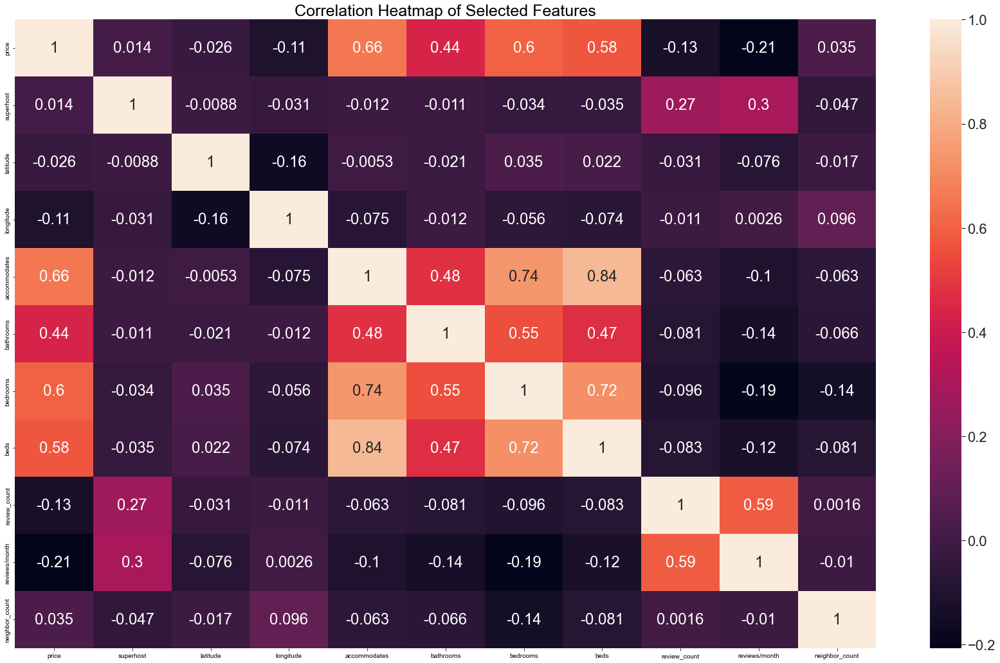

In [31]:
plt.figure(figsize = (30,18))
ax = plt.axes()
sns.set(font_scale=2)
sns.heatmap(subset.corr(), annot=True)
ax.set_title('Correlation Heatmap of Selected Features', fontsize=25)
plt.savefig('corr_heatmap.png')

### 4. Statistical model - run the random forest regression

Now I am biulding my model of predicting rent prices. I tried several algorithms but random forest is performing well.

To feed into the model, I furter preprocess the dataset; I used OneHotEncoding for categorical variables, and StandardScaler for continuous variables to avoid getting unbiased affects from some large variables.

In [39]:
y = subset['price']
X = subset.drop(columns=['price'])
X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

cat_cols = ['superhost','neighbourhood_cleansed', 'room_type']
con_cols = ['latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms',
            'beds','review_count','reviews/month']

preprocessor_ohe = ColumnTransformer(transformers=[('cat', OneHotEncoder(categories='auto'), cat_cols),
                                                   ('cont', StandardScaler(), con_cols)])
X_train_ohe = preprocessor_ohe.fit_transform(X_train_raw)
X_test_ohe = preprocessor_ohe.transform(X_test_raw)

In [40]:
rf_reg = ensemble.RandomForestRegressor(n_estimators=200,  # number of trees
                                        criterion='mse',  # how to measure fit
                                        max_depth=None,  # how deep tree nodes can go
                                        min_samples_split=2,  # samples needed to split node
                                        min_samples_leaf=1,  # samples needed for a leaf
                                        min_weight_fraction_leaf=0.0,  # weight of samples needed for a node
                                        max_features='auto',  # max feats
                                        max_leaf_nodes=None,  # max nodes
                                        n_jobs=1, # how many to run parallel
                                        random_state=42)

model = rf_reg.fit(X_train_ohe, y_train.ravel())

C:\Users\81801\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:388: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warn(


## 5. Evaluation

Once the model training has finished, I make a prediction using test set and evaluate how the model is performing. Then I tried to fine tune the model by optimizing hyperparameters using GridSerachCV. The results show that I only have R2 test score of around 62-63%, but the mans absolute error is around 26.3. So this model is not perfect and could be improved, but it is performing at the minimal level.

In [42]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

y_test_pred = model.predict(X_test_ohe)
y_train_pred = model.predict(X_train_ohe)

rf_mae = mean_absolute_error(y_test, y_test_pred) 
rf_mse = mean_squared_error(y_test, y_test_pred) 
rf_rmse = np.sqrt(rf_mse)
print('The MAE is: ',rf_mae)
print('The RMSE is: ',rf_rmse)

# R-Squared score
print('The R2 test score is: ', model.score(X_test_ohe, y_test))
print('The R2 train score is: ', model.score(X_train_ohe, y_train))
## RMSE is around 37. This is just 10% of the range in price. This seems good to me while the R2 score is around 62%.

The MAE is:  26.702534759358286
The RMSE is:  37.66554498101119
The R2 test score is:  0.619215293980424
The R2 train score is:  0.9470001440696195


In [43]:
# Credit: https://medium.com/@manilwagle/predicting-house-prices-using-machine-learning-cab0b82cd3f
from sklearn.model_selection import GridSearchCV

param_grid = [
    # try 12 (3×4) combinations of hyperparameters
    {'n_estimators': [50, 100, 200], 'max_features': [2,4,6,8,16]},
    # then try 6 (2×3) combinations with bootstrap set as False
    {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
  ]
rf_reg = ensemble.RandomForestRegressor(random_state=42)

# train across 5 folds, that's a total of (12+6)*5=90 rounds of training 
grid_search = GridSearchCV(rf_reg, param_grid, cv=5,
                           scoring='neg_mean_squared_error',
                           return_train_score=True)

grid_search.fit(X_train_ohe, y_train.ravel())
grid_search.best_params_

{'max_features': 16, 'n_estimators': 200}

In [45]:
final_model = grid_search.best_estimator_

y_test_pred = final_model.predict(X_test_ohe)
y_train_pred = final_model.predict(X_train_ohe)

rf_mae = mean_absolute_error(y_test, y_test_pred) 
rf_mse = mean_squared_error(y_test, y_test_pred) 
rf_rmse = np.sqrt(rf_mse)
print('The MAE is: ',rf_mae)
print('The RMSE is: ',rf_rmse)

# R-Squared score
print('The R2 test score is: ', final_model.score(X_test_ohe, y_test))
print('The R2 train score is: ', final_model.score(X_train_ohe, y_train))

The MAE is:  26.345008785332315
The RMSE is:  37.02575274487482
The R2 test score is:  0.6320415515371114
The R2 train score is:  0.9488312117347639
